In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from numpy.polynomial.polynomial import polyfit
import cartopy.crs as ccrs
import community
from nltk.corpus import stopwords
from nltk import word_tokenize
import string
import math
from wordcloud import WordCloud
import pandas as pd
from tqdm import tqdm_notebook as tqdm
import urllib
from bs4 import BeautifulSoup
import re
%matplotlib inline

In [2]:
community.__version__

'0.11'

In [3]:
# load the airport graph
G = nx.read_gpickle("pickle graphs\\subgraph")

print("{} nodes".format(G.number_of_nodes()))
print("{} edges".format(G.number_of_edges()))

3972 nodes
44505 edges


In [4]:
# subgraph of nodes with a degree higher than or equal to 100
H = G.subgraph([node[0] for node in G.nodes(data=True) if G.degree(node[0])>=100])

print("{} nodes".format(H.number_of_nodes()))
print("{} edges".format(H.number_of_edges()))

253 nodes
11873 edges


### Map projection

In [5]:
euro_map = [-34, 55, 25, 70]
na_map = [-170, -50, 10, 80]
sa_map = [-90, -30, -55, 15]
af_map = [-20, 55, -35, 35]
oc_map = [90, 180, -40, 15]
as_map = [25, 180, -3, 70]
wrong_nodes = []

def graph_plot(G, label_focus, colour_focus, zoom=0):
    pos = {}
    countries = []
    continents = []
    
    # get airport's position, country and continent
    for iata in G.nodes:
        pos[iata] = (float(G.node[iata]['longitude']), float(G.node[iata]['latitude']))
        countries.append(G.node[iata]['country'])
        continents.append(G.node[iata]['continent'])
                 
    
    # get unique set of countries and continents
    countries, continents = set(countries), set(continents)
    countries = [x for x in countries if str(x) != 'nan']
    continents = [x for x in continents if str(x) != 'nan']
    countries.append('nan')
    continents.append('nan')
    
    # set numerical value for each country/continent
    countries_id = {}
    continents_id = {}
    for val, country in enumerate(countries):
        countries_id[country] = val
    for val, continent in enumerate(continents):
        continents_id[continent] = val
    
    # create list of country/continent numbers in the correct order
    cny = []
    cnt = []
    for iata in G.nodes:
        cny.append(countries_id[str(G.node[iata]['country'])])
        cnt.append(continents_id[str(G.node[iata]['continent'])])
    
    # set node size according to degree
    deg = nx.degree(G)
    sizes = [deg[iata] for iata in G.nodes]
    
    # set iata code as node label for nodes whose degree is above the given percentile
    if isinstance(label_focus, int):
        labels = {iata: iata if deg[iata] >= np.percentile(list(dict(deg).values()), label_focus) else '' for iata in G.nodes}
    elif label_focus is 'off':
        labels = {iata: '' for iata in G.nodes}
    else:
        labels = label_focus
    
    # set color according to given parameter
    if colour_focus is 'country':
        node_col = cny
    elif colour_focus is 'continent':
        node_col = cnt
    else:
        node_col = colour_focus
    
    fig, ax = plt.subplots(1, 1, figsize=(18, 18), subplot_kw=dict(projection=ccrs.PlateCarree()))
    ax.coastlines()
    if zoom is not 0:
        ax.set_extent(zoom)    # zoom in on the map
        
    nx.draw_networkx(G, ax=ax,
                     font_size=11,
                     alpha=0.8,
                     width=0.025,
                     node_size=sizes,
                     labels=labels,
                     pos=pos,
                     node_color=node_col,
                     cmap = 'rainbow')

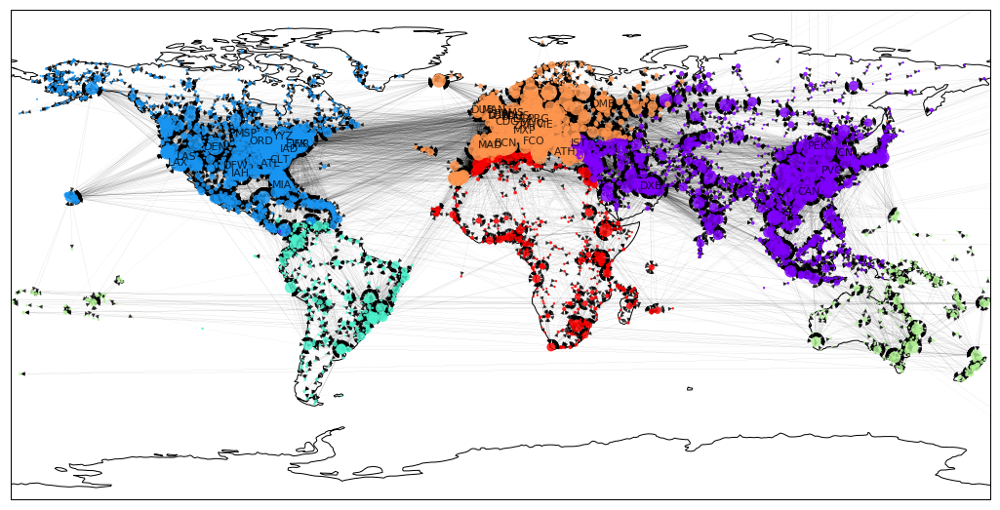

In [6]:
# visualize full graph
graph_plot(G, 99, 'continent')

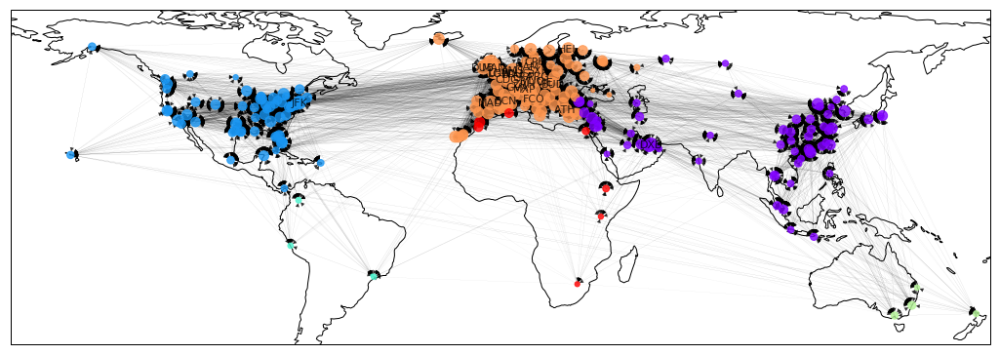

In [7]:
# subgraph of degree >= 100
graph_plot(H, 90, 'continent')

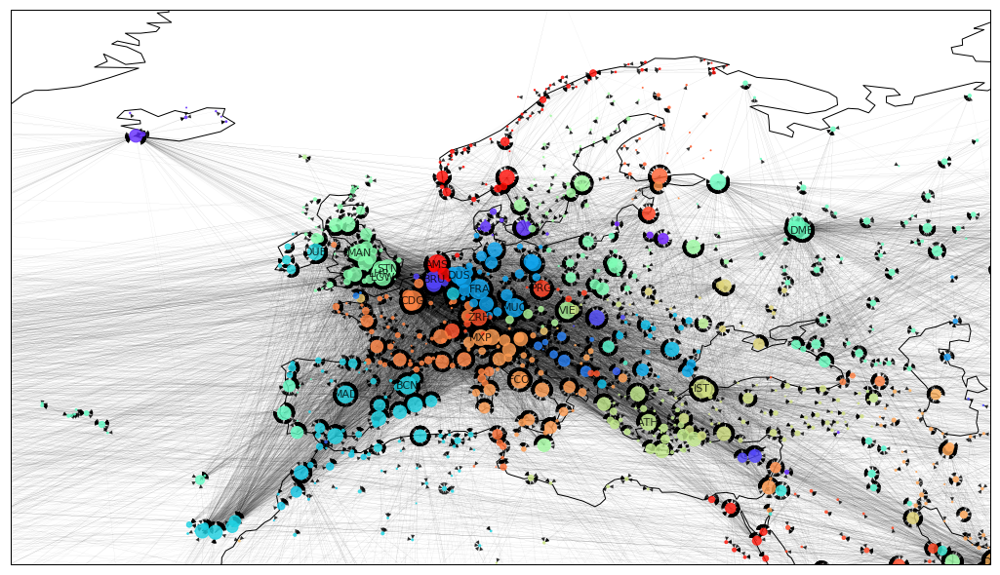

In [8]:
# zooming in on Europe
graph_plot(G, 99, 'country', zoom=euro_map)

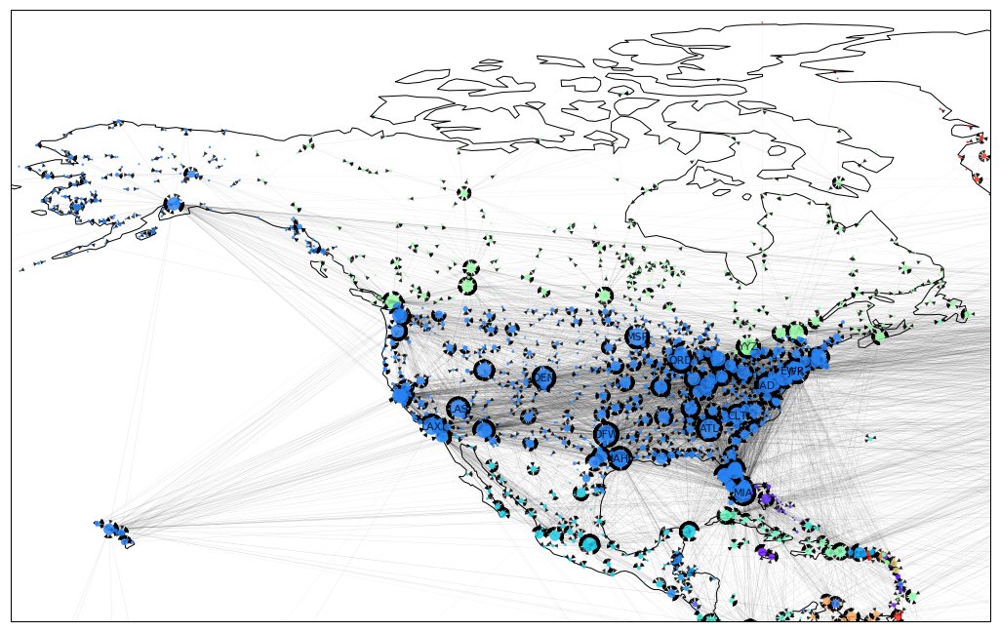

In [9]:
# zooming in on Europe
graph_plot(G, 99, 'country', zoom=na_map)

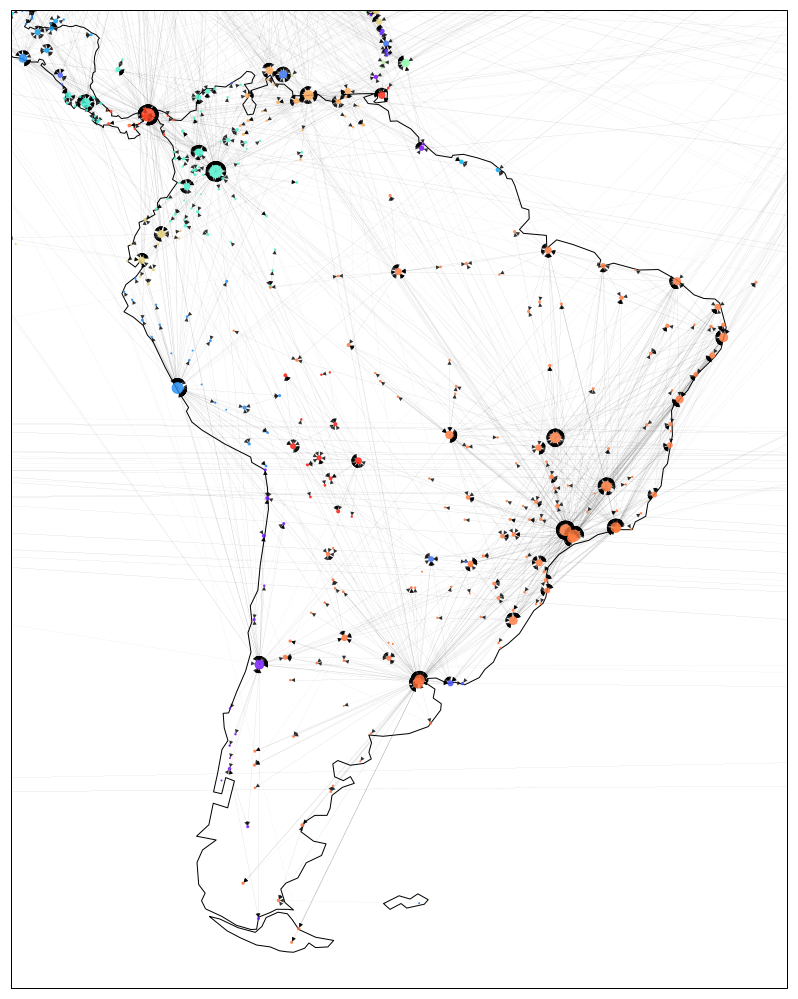

In [10]:
# zooming in on Europe
graph_plot(G, 99, 'country', zoom=sa_map)

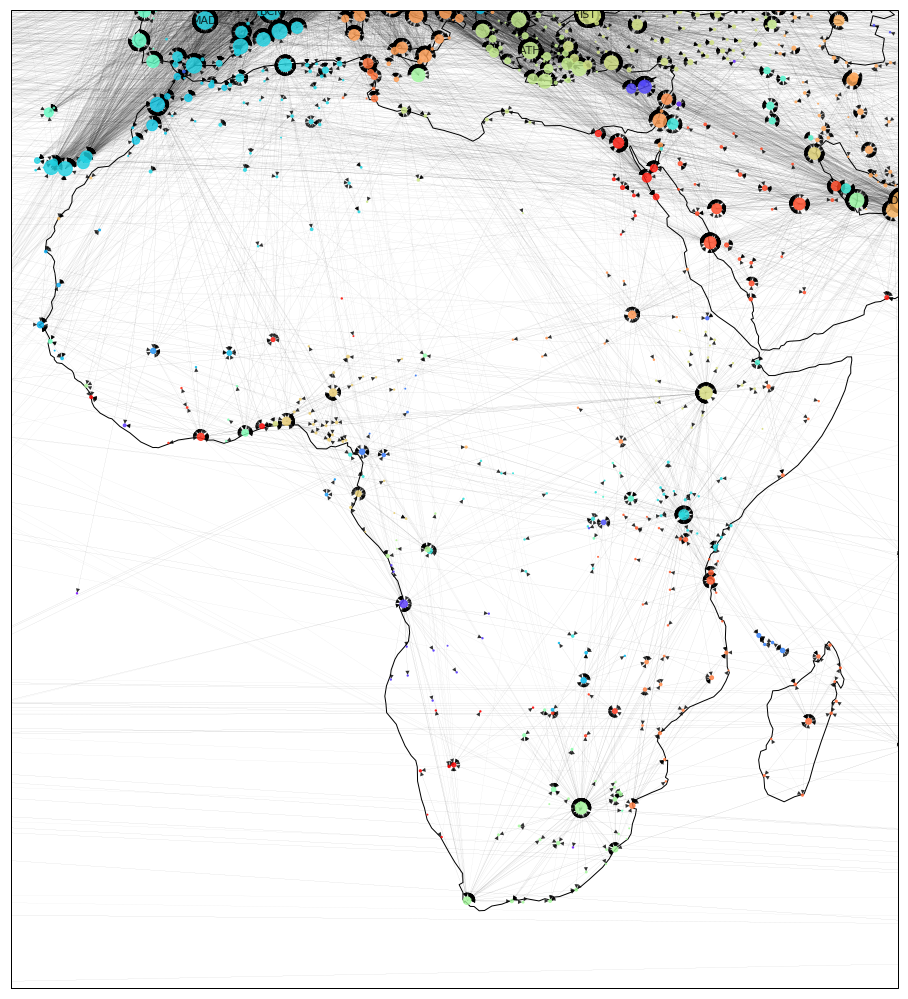

In [11]:
# zooming in on Europe
graph_plot(G, 99, 'country', zoom=af_map)

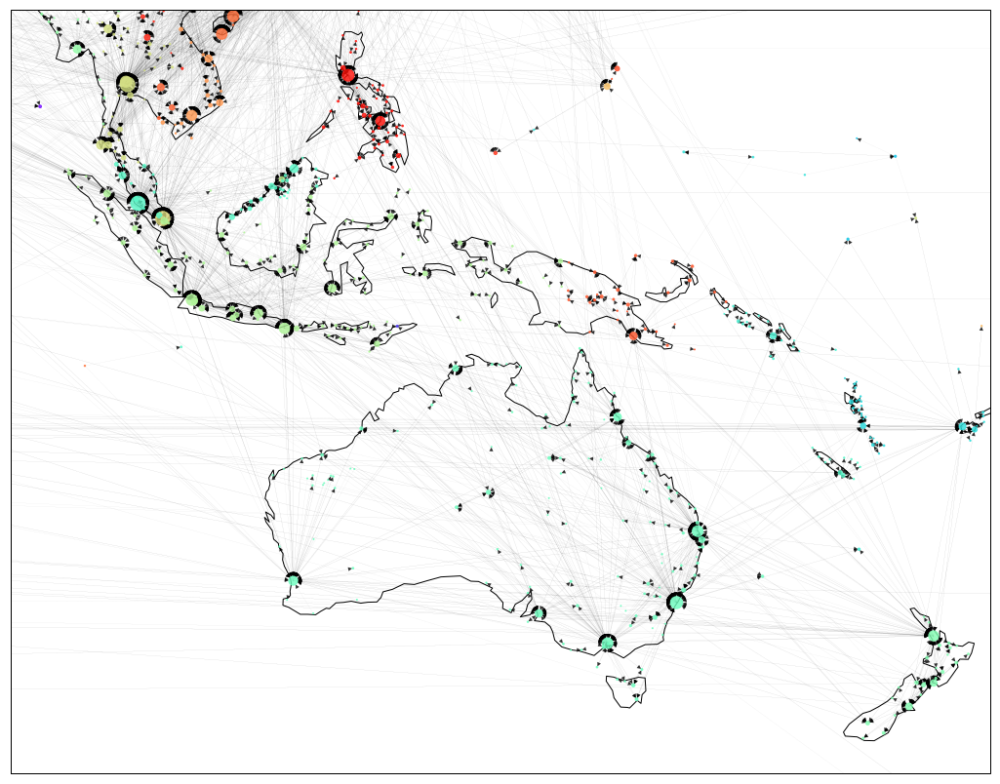

In [12]:
# zooming in on Europe
graph_plot(G, 99, 'country', zoom=oc_map)

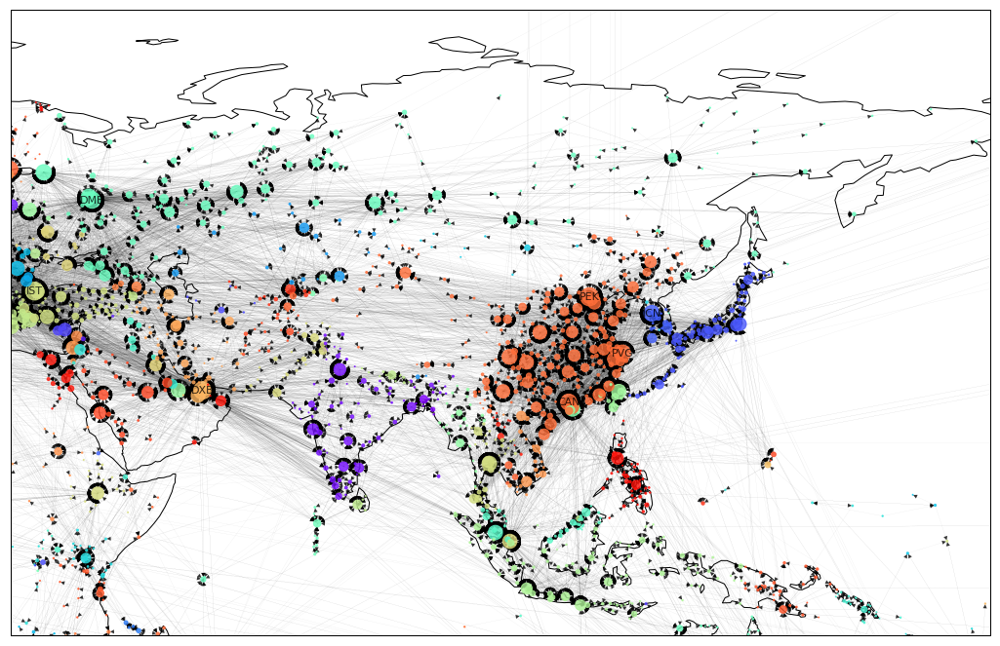

In [13]:
# zooming in on Europe
graph_plot(G, 99, 'country', zoom=as_map)

### Degree distributions

In [14]:
deg_dist = list(dict(G.degree()).values())

max_deg = max(deg_dist)
min_deg = min(deg_dist)
print("Maximum degree: {}".format(max_deg))
print("Minimum degree: {}".format(min_deg))

Maximum degree: 397
Minimum degree: 1


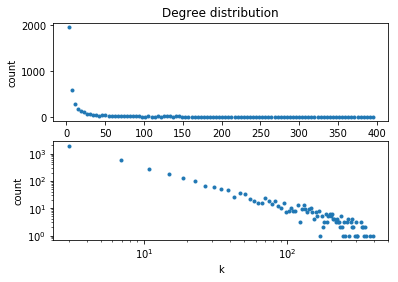

In [15]:
# bin the degree distribution
hist, bins = np.histogram(deg_dist, bins=100)
center = (bins[:-1] + bins[1:]) / 2

# scatter the bins in linear and loglog plot
f, ax = plt.subplots(2)
ax[0].scatter(center, hist, marker='.')
ax[0].set_ylabel('count')
ax[0].set_title("Degree distribution")
ax[1].loglog(center, hist, marker='.', lw=0)
ax[1].set_xlabel('k')
ax[1].set_ylabel('count')
plt.show()

In [16]:
# a dictionary of dictionaries to store centrality measures into
centrality = {'all': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]},
             'Europe': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]},
             'North America': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]},
             'South America': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]},
             'Africa': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]},
             'Asia': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]},
             'Oceania': {'degree':[], 'in-degree':[], 'out-degree':[], 'bc':[], 'ec':[]}}

# start with all continents
centrality['all']['degree'] = sorted(((d, n) for n, d in G.degree()), reverse=True)
centrality['all']['in-degree'] = sorted(((d, n) for n, d in G.in_degree()), reverse=True)
centrality['all']['out-degree'] = sorted(((d, n) for n, d in G.out_degree()), reverse=True)
centrality['all']['bc'] = sorted(((d, n) for n, d in dict(nx.betweenness_centrality(G)).items()), reverse=True)
centrality['all']['ec'] = sorted(((d, n) for n, d in dict(nx.eigenvector_centrality(G)).items()), reverse=True)

In [17]:
# per centrality measure, divide the list per continent
for value, airport in centrality['all']['degree']:
    continent = nx.get_node_attributes(G, 'continent')[airport]
    centrality[continent]['degree'].append((value, airport))

for value, airport in centrality['all']['in-degree']:
    continent = nx.get_node_attributes(G, 'continent')[airport]
    centrality[continent]['in-degree'].append((value, airport))
    
for value, airport in centrality['all']['out-degree']:
    continent = nx.get_node_attributes(G, 'continent')[airport]
    centrality[continent]['out-degree'].append((value, airport))
    
for value, airport in centrality['all']['bc']:
    continent = nx.get_node_attributes(G, 'continent')[airport]
    centrality[continent]['bc'].append((value, airport))
    
for value, airport in centrality['all']['bc']:
    continent = nx.get_node_attributes(G, 'continent')[airport]
    centrality[continent]['bc'].append((value, airport))

In [18]:
# neatly print an ordered list for a specific continent and measure
def print_centrality(continent, measure, limit):
    i = 1
    for value, airport in centrality[continent][measure][:limit]:
        if measure == 'bc' or measure == 'ec':
            print(i,'\t',airport,'\t{:.4f}'.format(value))
        else:
            print(i,'\t',airport,'\t',value)
        i+=1

In [19]:
print_centrality('all', 'ec', 5)

1 	 CDG 	0.1576
2 	 MUC 	0.1555
3 	 AMS 	0.1554
4 	 FRA 	0.1504
5 	 BCN 	0.1422


In [20]:
print_centrality('Europe', 'degree', 10)

1 	 FRA 	 397
2 	 CDG 	 378
3 	 AMS 	 355
4 	 MUC 	 339
5 	 STN 	 332
6 	 BCN 	 307
7 	 DUS 	 303
8 	 MAD 	 300
9 	 BRU 	 300
10 	 LGW 	 298


### Community detection

In [21]:
def get_modularity(graphs):
    nedges = G.number_of_edges()
    mod = 0
    for graph in graphs:
        graph_mod = graph.number_of_edges()/nedges - (sum(dict(graph.degree()).values())/(2*nedges))**2
        mod += graph_mod
        
    return mod

In [22]:
continents = ['Europe','North America','South America','Africa','Asia','Oceania']
graphs = []

# create subgraphs for each continent
for continent in continents:
    graphs.append(G.subgraph([node[0] for node in G.nodes(data=True)
                              if node[1]['continent'] == continent]))

print("Continent modularity = {}".format(get_modularity(graphs)))

Continent modularity = 0.6541220862611093


In [23]:
undir_G = G.to_undirected()    # necessary for community partitioning
graphs = []

part = community.best_partition(undir_G)    # best partition using Louvain algorithm
#partb = community.greedy_modularity_communities(undir_G)
#partc = community.girven_newman(undir_G)

size = len(set(part.values()))
print("{} communities detected".format(size))
for i in range(size):
    graphs.append(G.subgraph([name for name, item in part.items()
                            if item == i]))

print("\nPython Louvain modularity:\n{}".format(get_modularity(graphs)))

32 communities detected

Python Louvain modularity:
0.694067379706777


In [24]:
# Create confusion matrix for louvain partitions and continents
D = [[0 for b in range(6)] for c in range(size)]

for i in range(size):
    D[i][0] = len([node for node in G.nodes(data=True) if node[1]['continent'] == "Europe" and part[node[0]] == i])
    D[i][1] = len([node for node in G.nodes(data=True) if node[1]['continent'] == "North America" and part[node[0]] == i])
    D[i][2] = len([node for node in G.nodes(data=True) if node[1]['continent'] == "South America" and part[node[0]] == i])
    D[i][3] = len([node for node in G.nodes(data=True) if node[1]['continent'] == "Africa" and part[node[0]] == i])
    D[i][4] = len([node for node in G.nodes(data=True) if node[1]['continent'] == "Asia" and part[node[0]] == i])
    D[i][5] = len([node for node in G.nodes(data=True) if node[1]['continent'] == "Oceania" and part[node[0]] == i])

D = np.matrix(D)
print(D)

[[  0  63   0   0   0   0]
 [  0   0   0   0   3 252]
 [  0   0   0   0 501   5]
 [504   3   0  78  13   0]
 [  6   0   1  49 294   0]
 [  6 697   0   1   2   2]
 [  7  12   0   0   0   0]
 [  2 251   1   1   0   0]
 [  0 173   0   0   2   0]
 [  0   0   0 211   0   0]
 [ 71   0   0   0 133   0]
 [  1 138 126   0   0   0]
 [  0   0 159   0   0   0]
 [  0  18   0   0   0  37]
 [  2   0   0   0   0   0]
 [  0   1   0   0 102   1]
 [  0   2   0   0   0   0]
 [  0   0   0   2   0   0]
 [  0   0   0   4   0   0]
 [  2   0   0   0   0   0]
 [  2   0   0   0   0   0]
 [  0   0   0   0   0   2]
 [  0   0   0   0   0  10]
 [  0   0   0   0   0   2]
 [  0   2   0   0   0   0]
 [  0   2   0   0   0   0]
 [  2   0   0   0   0   0]
 [  0   2   0   0   0   0]
 [  0   2   0   0   0   0]
 [  0   0   0   0   0   3]
 [  0   2   0   0   0   0]
 [  0   2   0   0   0   0]]


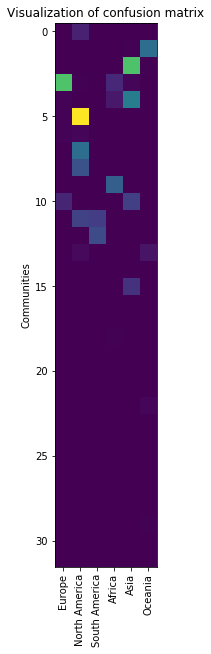

In [25]:
# plot confusion matrix
plt.figure(figsize=(60,10))
plt.imshow(D)
plt.title("Visualization of confusion matrix")
plt.xticks(range(6),continents,rotation='vertical')
plt.ylabel("Communities")
plt.show()

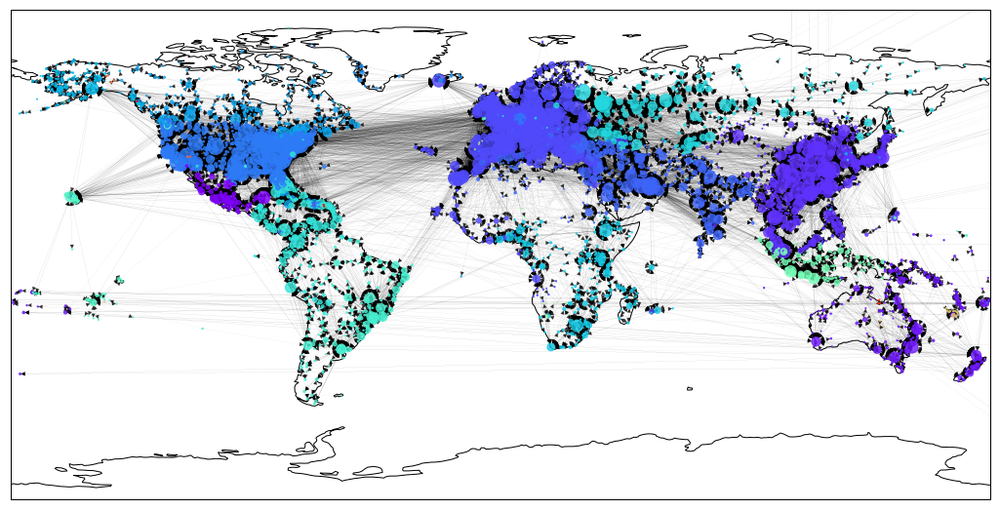

In [26]:
colourmap = [part[node] for node in G.nodes()]

graph_plot(G, 'off', colourmap)

In [27]:
# subsample of the confusion matrix
D_sub = np.zeros(shape=(14,6),dtype='int16')
rows = [0,1,2,3,4,5,7,8,9,10,11,12,13,15]

for i in range(14):
    D_sub[i][:] = D[rows[i]][:]
    
print(D_sub)

[[  0  63   0   0   0   0]
 [  0   0   0   0   3 252]
 [  0   0   0   0 501   5]
 [504   3   0  78  13   0]
 [  6   0   1  49 294   0]
 [  6 697   0   1   2   2]
 [  2 251   1   1   0   0]
 [  0 173   0   0   2   0]
 [  0   0   0 211   0   0]
 [ 71   0   0   0 133   0]
 [  1 138 126   0   0   0]
 [  0   0 159   0   0   0]
 [  0  18   0   0   0  37]
 [  0   1   0   0 102   1]]


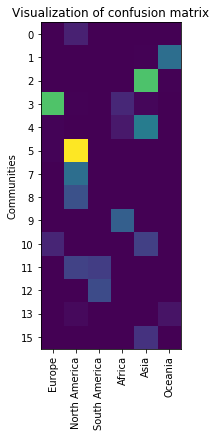

In [28]:
# plot confusion matrix
plt.figure(figsize=(14,6))
plt.imshow(D_sub)
plt.title("Visualization of confusion matrix")
plt.xticks(range(6),continents,rotation='vertical')
plt.yticks(range(14),rows)
plt.ylabel("Communities")
plt.show()

In [29]:
subcolourmap = [i for i in range(len(colourmap))]
for i in range(len(colourmap)):
    if colourmap[i] in rows:
        subcolourmap[i] = rows.index(colourmap[i])
    else:
        subcolourmap[i] = 14

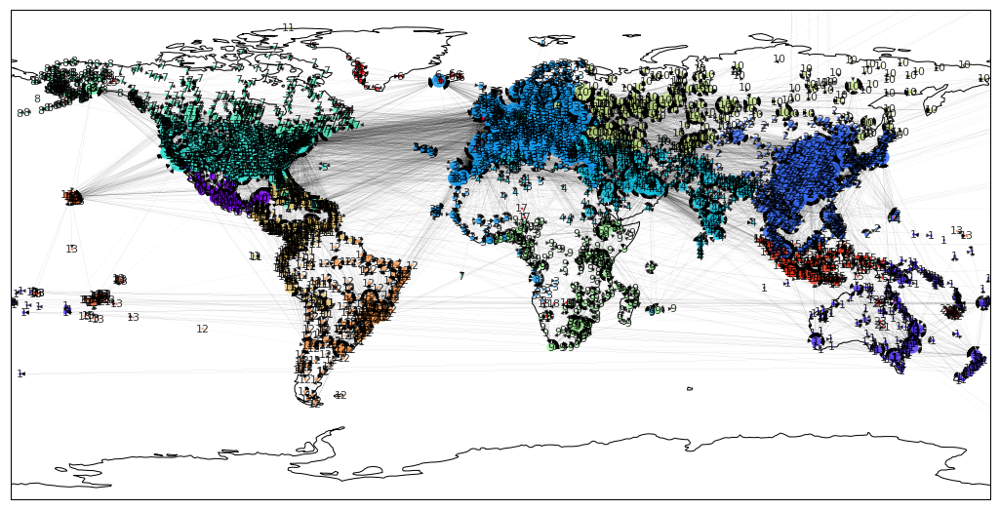

In [30]:
graph_plot(G, part, subcolourmap)

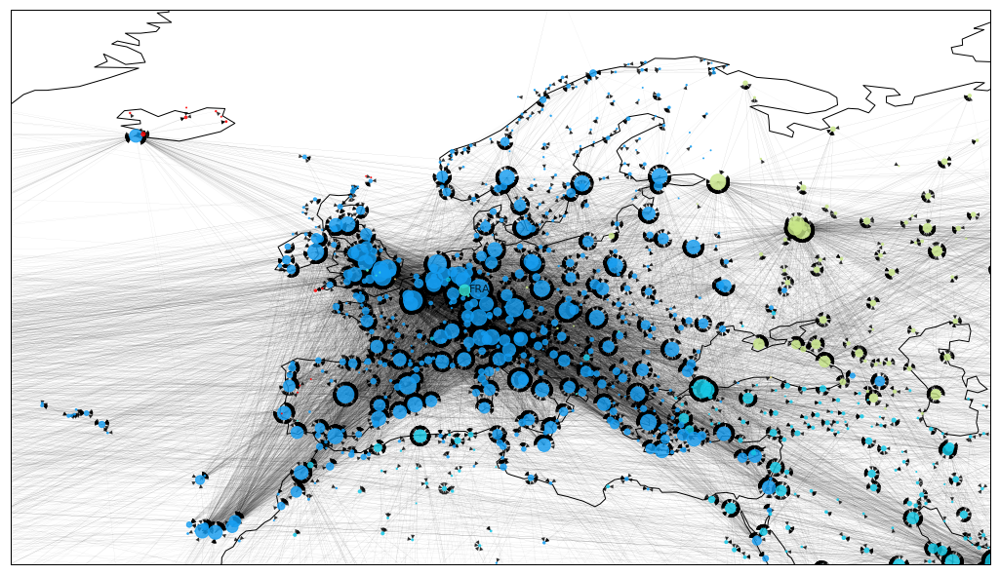

In [31]:
graph_plot(G, 100, subcolourmap, zoom=euro_map)

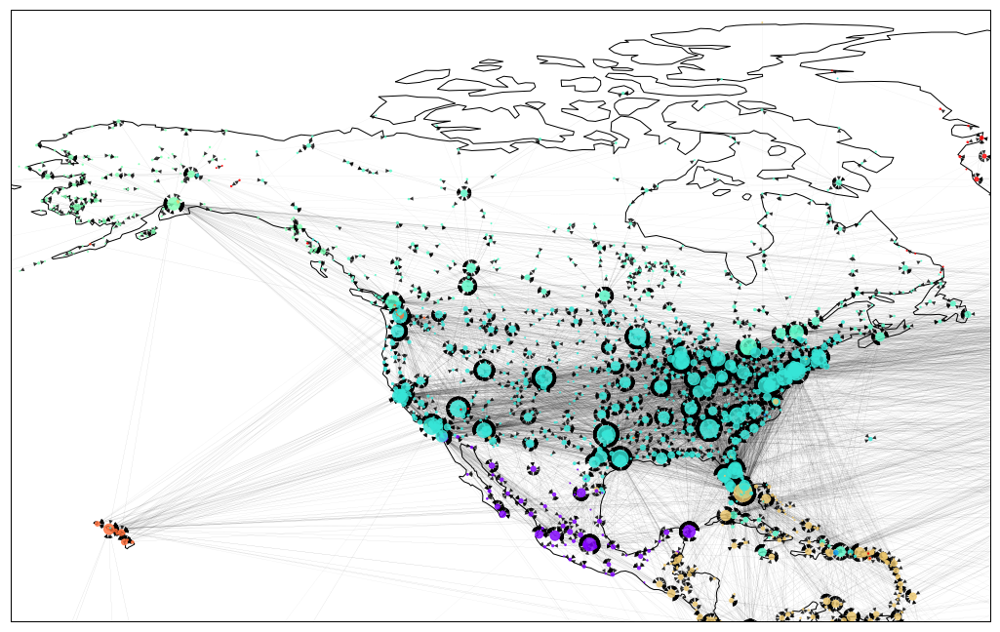

In [32]:
graph_plot(G, 100, subcolourmap, zoom=na_map)

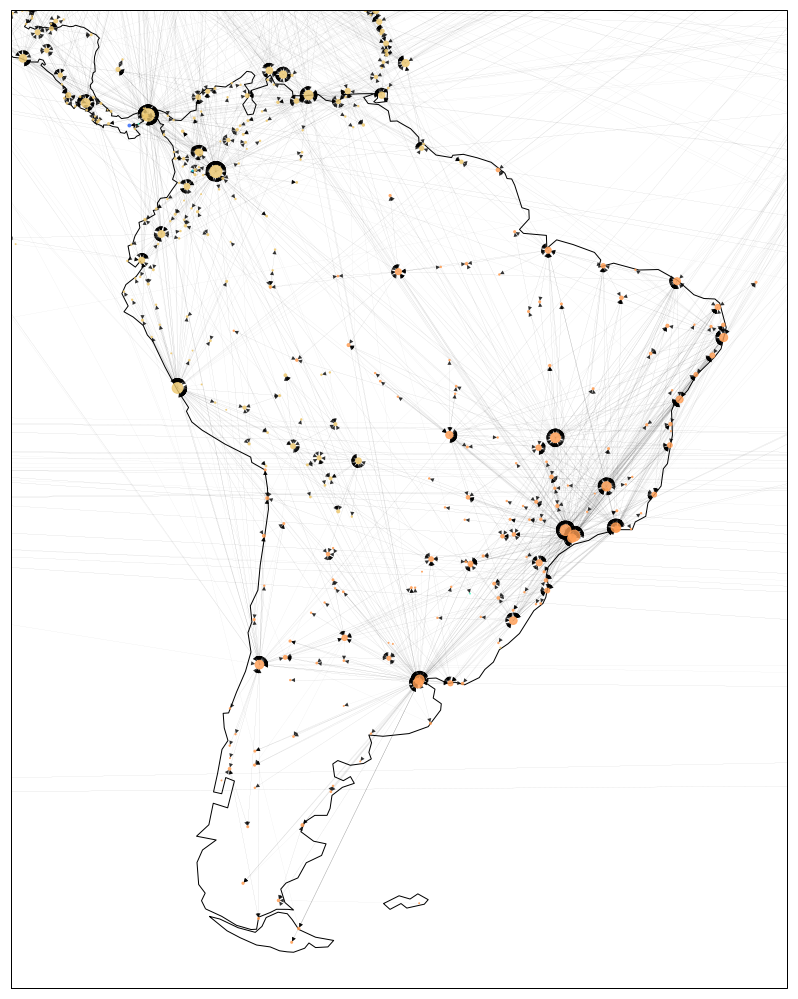

In [33]:
graph_plot(G, 100, subcolourmap, zoom=sa_map)

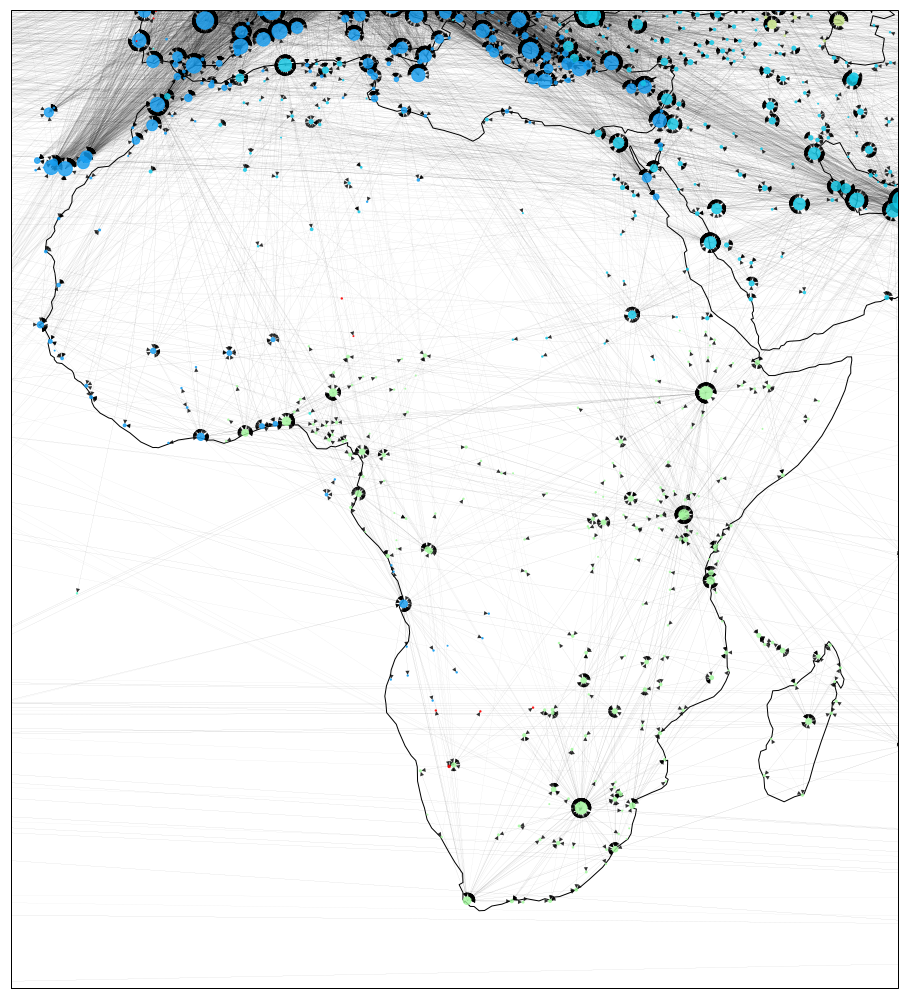

In [34]:
graph_plot(G, 100, subcolourmap, zoom=af_map)

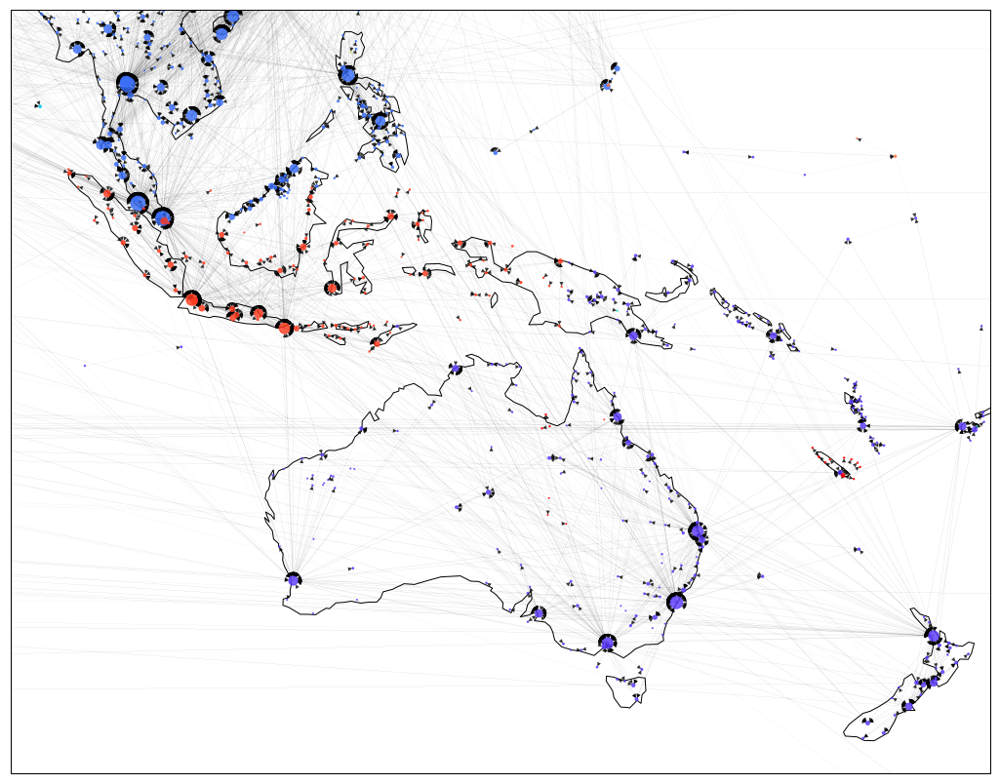

In [35]:
graph_plot(G, 100, subcolourmap, zoom=oc_map)

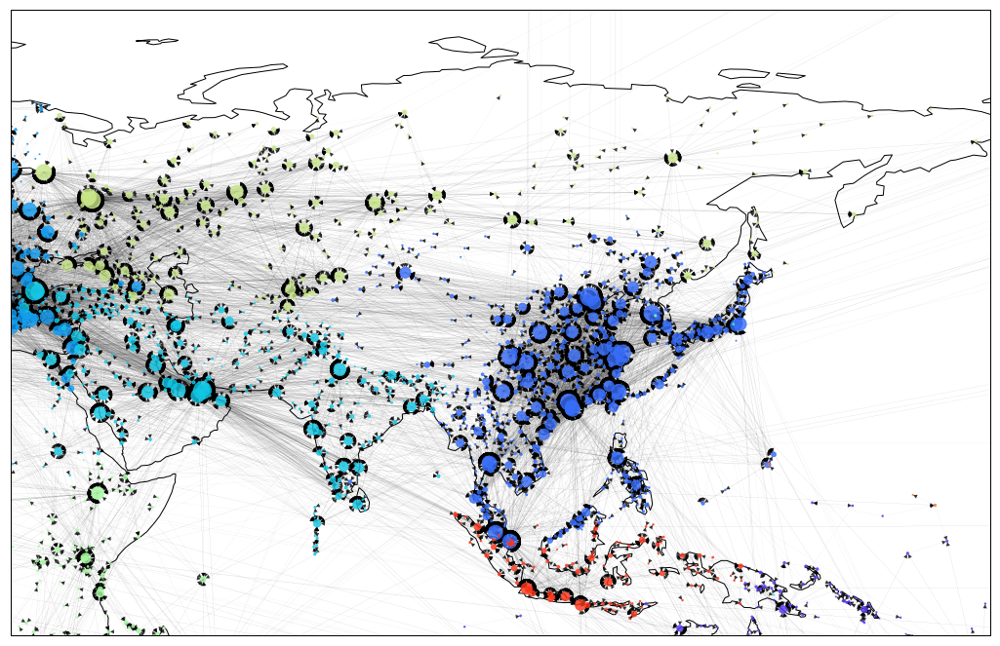

In [36]:
graph_plot(G, 100, subcolourmap, zoom=as_map)

In [37]:
def countries_in_partition(partition):
    nodelist = []
    for node in G.nodes(data=True):
        if part[node[0]] is partition:
            country = node[1]['country']
            if str(country) != 'nan':
                nodelist.append(country)

    nodedict = {}
    for country in set(nodelist):
        nodedict[country] = nodelist.count(country)

    print(sorted(((v, k) for k, v in nodedict.items()), reverse=True), "\n")

In [38]:
def degree_in_partition(partition):
    nodelist = []
    for node in G.nodes(data=True):
        if part[node[0]] is partition:
            degree = node[1]['degree']
            if str(country) != 'nan':
                nodelist.append(degree)

    nodedict = {}
    for country in set(nodelist):
        nodedict[degree] = nodelist.count(degree)

    print(sorted(((v, k) for k, v in nodedict.items()), reverse=True), "\n")

In [39]:
for partition in rows:
    print("Partition:", partition)
    countries_in_partition(partition)

Partition: 0
[(63, 'MX')] 

Partition: 1
[(124, 'AU'), (29, 'PG'), (27, 'NZ'), (24, 'VU'), (20, 'SB'), (11, 'FJ'), (3, 'FM'), (3, 'CK'), (2, 'WF'), (2, 'TO'), (1, 'WS'), (1, 'TV'), (1, 'TL'), (1, 'NU'), (1, 'NR'), (1, 'NF'), (1, 'NC'), (1, 'KI'), (1, 'CX'), (1, 'CC')] 

Partition: 2
[(211, 'CN'), (78, 'JP'), (42, 'PH'), (34, 'TH'), (33, 'MY'), (25, 'MM'), (21, 'VN'), (15, 'KR'), (13, 'TW'), (10, 'LA'), (9, 'MN'), (3, 'KH'), (2, 'SG'), (2, 'MP'), (1, 'PW'), (1, 'MO'), (1, 'KP'), (1, 'IN'), (1, 'HK'), (1, 'GU'), (1, 'FM'), (1, 'BN')] 

Partition: 3
[(57, 'FR'), (51, 'GB'), (47, 'NO'), (40, 'ES'), (39, 'GR'), (38, 'IT'), (37, 'SE'), (29, 'DE'), (20, 'FI'), (15, 'PL'), (14, 'PT'), (14, 'MA'), (12, 'RO'), (12, 'AO'), (10, 'UA'), (9, 'HR'), (8, 'DK'), (7, 'CV'), (7, 'CH'), (6, 'TN'), (6, 'LY'), (6, 'IE'), (6, 'DZ'), (6, 'BY'), (6, 'AT'), (5, 'IL'), (5, 'BE'), (4, 'TR'), (4, 'SK'), (4, 'NL'), (4, 'EE'), (4, 'CZ'), (4, 'CI'), (4, 'BG'), (3, 'MR'), (3, 'LT'), (3, 'BA'), (2, 'US'), (2, 'ST'), (2

# Sentiment Analysis
### Airport mapping

In [42]:
codemap = {'FRA': 'frankfurt-main-airport',
           'CDG': 'paris-cdg-airport',
           'AMS': 'amsterdam-schiphol-airport',
           'PEK': 'beijing-capital-airport',
           'ATL': 'atlanta-hartsfield-airport',
           'MIA': 'miami-airport',
           'ORD': 'chicago-ohare-airport',
           'STN': 'london-stansted-airport',
           'BRU': 'brussels-zaventem-airport',
           'LTN': 'luton-airport',
           'SXF': 'berlin-schonefeld-airport',
           'MUC': 'munich-airport',
           'DFW': 'dallas-fort-worth-airport',
           'JFK': 'new-york-jfk-airport',
           'BOG': 'bogota-airport',
           'GRU': 'sao-paulo-guarulhos-airport',
           'VCP': 'sao-paulo-viracopos',
           'LIM': 'lima-airport',
           'BSB': 'brasilia-airport',
           'CMN': 'casablanca-airport',
           'ALG': 'algiers-airport',
           'ADD': 'addis-ababa-airport',
           'JNB': 'johannesburg-or-tambo-airport',
           'RAK': 'marrakech-airport',
           'IST': 'istanbul-ataturk-airport',
           'DXB': 'dubai-airport',
           'PVG': 'shanghai-pudong-airport',
           'CAN': 'guangzhou-airport',
           'SYD': 'sydney-airport',
           'BNE': 'brisbane-airport',
           'MEL': 'melbourne-airport',
           'AKL': 'auckland-airport',
           'PER': 'perth-airport',
           'ANC': 'anchorage-airport',
           'LHR': 'london-heathrow-airport',
           'LAX': 'los-angeles-lax-airport',
           'ICN': 'seoul-incheon-airport',
           'BCN': 'barcelona-airport',
          }

### Downloading airport reviews

In [43]:
# for each continent, get the 5 airports with the highest degree
airports = []
airport_codes = []
for continent in continents:
    for value, airport in centrality[continent]['degree'][:5]:
        airport_codes.append(airport.lower())  # to filter out airport codes later
        airports.append(codemap[airport])

In [44]:
# The two lines below are necessary to avoid a 403 error message when loading the page
user_agent = 'Mozilla/5.0 (Windows; U; Windows NT 5.1; en-US; rv:1.9.0.7) Gecko/2009021910 Firefox/3.0.7'
headers = {'User-Agent':user_agent,}

# Constructing the URL
baseurl = "https://www.airlinequality.com/airport-reviews/"
pagesize = "/?sortby=post_date%3ADesc&pagesize=100"    # the latest 100 reviews

reviewdict = {}
for airport in tqdm(airports):
    # Loading the page
    request = urllib.request.Request(baseurl+airport+pagesize,None,headers)
    response = urllib.request.urlopen(request).read()
    soup = BeautifulSoup(response)
    
    raw = str(soup)
    
    start = re.search("Customer rating from ", raw).end()
    raw = raw[start+41:].splitlines()
    nbr_of_reviews = int(re.findall("[0-9]+", raw[0])[0])
    avggrade = int(raw[6][13:14])

    # The reviews can be found within the first <article> tag
    reviews = soup.find_all("article")[0]
    # Each separate review can be found within an <article> tag as well
    reviews = reviews.find_all("article")

    review_details = []
    for review in reviews:
        raw = str(review)
        
        # get details from the reviews
        author = re.findall('name\"\>(.*?)\<', raw)[0]
        date = re.findall('datetime\=\"(.*?)\"', raw)[0]
        try:
            grade = int(re.findall('ratingValue\"\>([0-9]+)\<', raw)[0])
        except:
            grade = None
        try:
            country = re.findall('\<\/span\>\<\/span\> \((.*?)\)', raw)[0]
        except:
            country = None
        
        comment = str(review.get_text())    # Get text from the reviews
        try:
            title = comment.split('"')[1]    # Title is listed within "" quotes
        except:
            title = ""    # Older comments have no title

        try:
            start = re.search("\|", comment).start()    # Review body usually starts after '|'
        except:
            start = re.search("20[0-9]{2}", comment).end()    # otherwise it starts after a date, e.g. '2018'

        # Review body ends before one of these phrases
        end = re.search("Experience At Airport|Queuing Times|Recommended", comment).start()
        
        text = title+" | "+comment[start+2:end-3]
        review_details.append({'author': author, 'country': country, 'date': date, 'grade': grade, 'text': text})
    
    airport = airport.replace("-", " ")
    reviewdict[airport] = {'number': nbr_of_reviews, 'grade': avggrade, 'reviews': review_details}

C:\Users\elind\Anaconda2\envs\py36\lib\site-packages\bs4\__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("lxml"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 193 of the file C:\Users\elind\Anaconda2\envs\py36\lib\runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup(YOUR_MARKUP})

to this:

 BeautifulSoup(YOUR_MARKUP, "lxml")

  markup_type=markup_type))


### Sentiment analysis

In [45]:
# import LabMT dataset for sentiment analysis
df = pd.read_csv('LabMT.csv', encoding='utf-8')

# convert to simple dict to speed up analysis
labmt = {}
for word in tqdm(df['word'].tolist()):
    index = df.index[df['word'] == word].tolist()[0]
    labmt[word] = df.happiness_average[index]

In [46]:
def sentiment(text):
    sentiment = 0
    
    tokens = word_tokenize(text)
    n = len(tokens)
    
    for token in tokens:
        try:    # try to find the word in the LabMT wordlist
            sentiment += labmt[token.lower()]
        except:    # reduce length of tokens if token is not in wordlist
            n = n-1
    
    if n>0:    # if one of more words were in the wordlist
        return sentiment/n    # return average sentiment
    else:
        return 0

In [47]:
import nltk
nltk.download()

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [48]:
# Find review grade, number of reviews and average review sentiment for all airports
for airport, d in reviewdict.items():
    reviewlist = d['reviews']
    n = d['number']
    g = d['grade']
    print("Airport: " + airport)
    l = len(reviewlist)
    
    sent = 0
    for i in range(len(reviewlist)):
        text = reviewlist[i]['text']
        s = sentiment(text)
        if s > 0:
            sent += s
        else:
            l = l-1
    
    print("Average review grade: ", g,"\nNumber of reviews: ", n,"\nAverage review sentiment: ", sent/l, "\n")

Airport: frankfurt main airport
Average review grade:  3 
Number of reviews:  466 
Average review sentiment:  5.2869246675465424 

Airport: paris cdg airport
Average review grade:  3 
Number of reviews:  649 
Average review sentiment:  5.355216198944732 

Airport: amsterdam schiphol airport
Average review grade:  5 
Number of reviews:  463 
Average review sentiment:  5.349758718445987 

Airport: munich airport
Average review grade:  5 
Number of reviews:  215 
Average review sentiment:  5.395103963319407 

Airport: london stansted airport
Average review grade:  2 
Number of reviews:  824 
Average review sentiment:  5.26781238424927 

Airport: atlanta hartsfield airport
Average review grade:  4 
Number of reviews:  240 
Average review sentiment:  5.3244008182990035 

Airport: miami airport
Average review grade:  2 
Number of reviews:  367 
Average review sentiment:  5.334365156196847 

Airport: dallas fort worth airport
Average review grade:  4 
Number of reviews:  146 
Average review s

In [52]:
# example of positive review
r = reviewdict['amsterdam schiphol airport']['reviews'][14]['text']
print("Sentiment: ", sentiment(r), "\n\n", r)

Sentiment:  5.5512765957446835 

 great service, stress-free | A word of praise for the Lost and Found Service. We were in transit and after a long flight from Panama, my 14 year old son absent-mindedly forgot his telephone on board the plane. The staff at the L&F counter gave us a warm welcome and immediately set off back to the plane to search for the missing item. She recovered the phone and kindly brought it to our next boarding gate as time was short. This all entailed a great deal of walking and yet the lady greeted us with a smile and kind words. Great service, stress-free.


In [50]:
# example of negative review
r = reviewdict['amsterdam schiphol airport']['reviews'][10]['text']
print("Sentiment: ", sentiment(r), "\n\n", r)

Sentiment:  5.425375000000003 

 extremely slow |  I fly weekly from Schiphol. Security run times are in comparison to other airports extremely slow. Schiphol please make this easy benchmark to optimise your operations. Further there are a large number of security personnel who use above average volume to direct people in a rather direct way (this is the polite phrasing as I would not even address house pets this way). Again here an easy benchmark is that with reduced number of personnel and basic customer skills both costs and customer experience are improved.


### Review Sentiment vs Grade

In [116]:
import datetime
gradelist = []
sentlist = []
datelist = []
authlist = []
weeklist = []
hemispherelist = []
degreelist = []

# List grade, sentiment, month and author of all reviews
for airport, d in reviewdict.items():
    for review in d['reviews']:
        text = review['text']
        sentlist.append(sentiment(text))
        gradelist.append(review['grade'])
        authlist.append(review['author'])

        d = datetime.datetime.strptime(review['date'],'%Y-%m-%d')
        weeklist.append(datetime.datetime.strftime(d,'%W'))     
        
        airportcode = list(codemap.keys())[list(codemap.values()).index(airport.replace(" ", "-"))]
        degreelist.append(G.degree[airportcode])
                
        if G.node[airportcode]['latitude'] < 0:
            hemispherelist.append('sh')
        else:
            hemispherelist.append('nh')
            
        # date is in the format 'yyyy-mm-dd', so we cast the 'mm' part to integer
        datelist.append(int(review['date'].split('-')[1]))


In [117]:
# removing all cases where the grade is None for the linear fit
nones = [i for i in range(len(gradelist)) if gradelist[i] is None]
NNgradelist = np.array([gradelist[i] for i in range(len(gradelist)) if i not in nones])
NNsentlist = np.array([sentlist[i] for i in range(len(sentlist)) if i not in nones])
NNdatelist = [datelist[i] for i in range(len(datelist)) if i not in nones]
NNweeklist = [weeklist[i] for i in range(len(weeklist)) if i not in nones]
NNhemispherelist = [hemispherelist[i] for i in range(len(hemispherelist)) if i not in nones]
NNdegreelist = [degreelist[i] for i in range(len(degreelist)) if i not in nones]

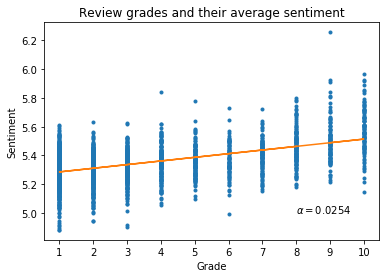

In [79]:
# Fit with polyfit for linear regression line
b, m = polyfit(NNgradelist, NNsentlist, 1)

# Plot all cases including linear fit
plt.plot(gradelist, sentlist, lw=0, marker='.')
plt.plot(NNgradelist, b + m * NNgradelist, '-')
plt.title('Review grades and their average sentiment')
plt.xlabel('Grade')
plt.ylabel('Sentiment')
plt.text(8,5, r'$ \alpha = ${:.4f}'.format(m))
plt.xticks(np.linspace(1,10,10,dtype='int16'))
plt.show()

### Review Grade/Sentiment vs Date

In [127]:
dategrade = {}
avggrade = []
sdgrade = []
dategrade_nh = {}
avggrade_nh = []
sdgrade_nh = []
dategrade_sh = {}
avggrade_sh = []
sdgrade_sh = []

# declare an empty array for each month
for i in set(NNdatelist):
    month = str(i)
    dategrade[month] = []
    dategrade_nh[month] = []
    dategrade_sh[month] = []
    

# create array of grades for reviews written in each month
for i in range(len(NNdatelist)):
    month = str(NNdatelist[i])
    hemisphere = NNhemispherelist[i]
    dategrade[month].append(NNgradelist[i])
    if hemisphere == 'sh':
        dategrade_sh[month].append(NNgradelist[i])
    elif hemisphere == 'nh':
        dategrade_nh[month].append(NNgradelist[i])
    

# calculate average and standard deviation for each grade array
for key, values in dategrade.items():
    avggrade.append(np.mean(values))
    sdgrade.append(np.std(values))
    
for key, values in dategrade_sh.items():
    avggrade_sh.append(np.mean(values))
    sdgrade_sh.append(np.std(values))

for key, values in dategrade_nh.items():
    avggrade_nh.append(np.mean(values))
    sdgrade_nh.append(np.std(values))

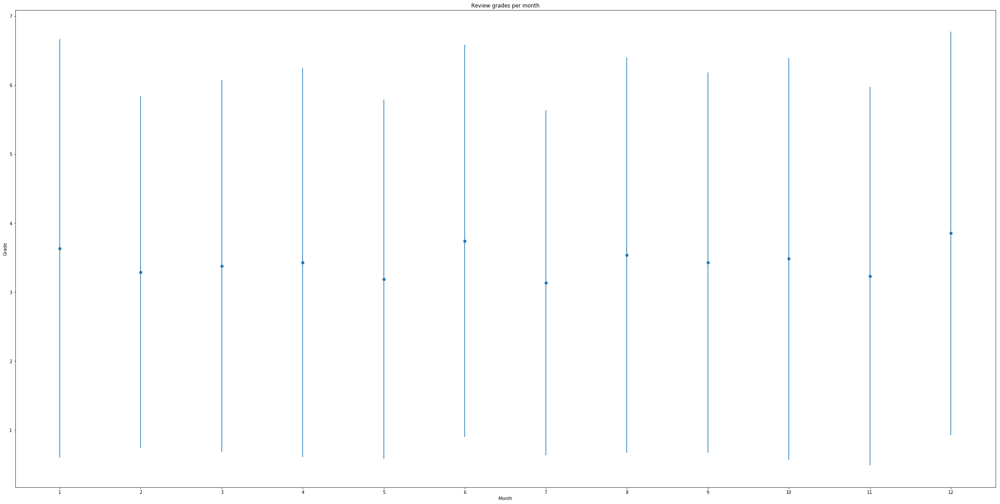

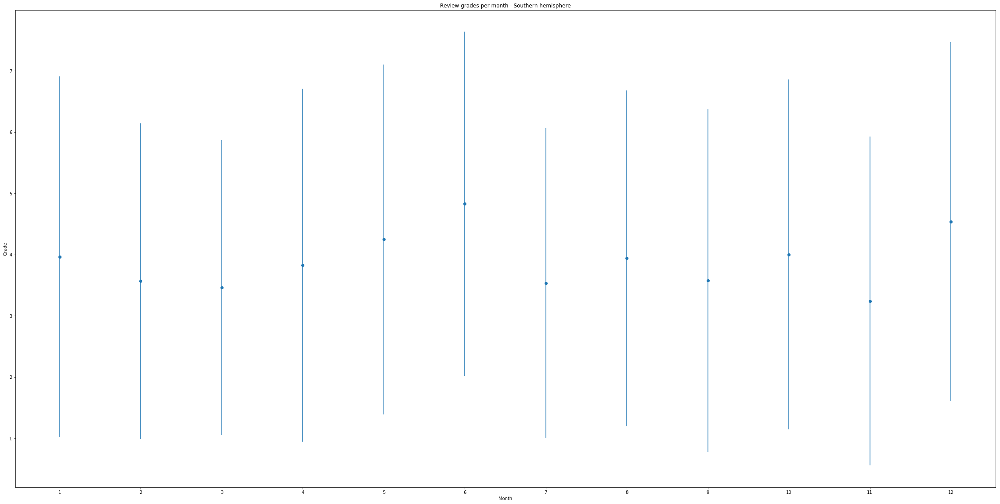

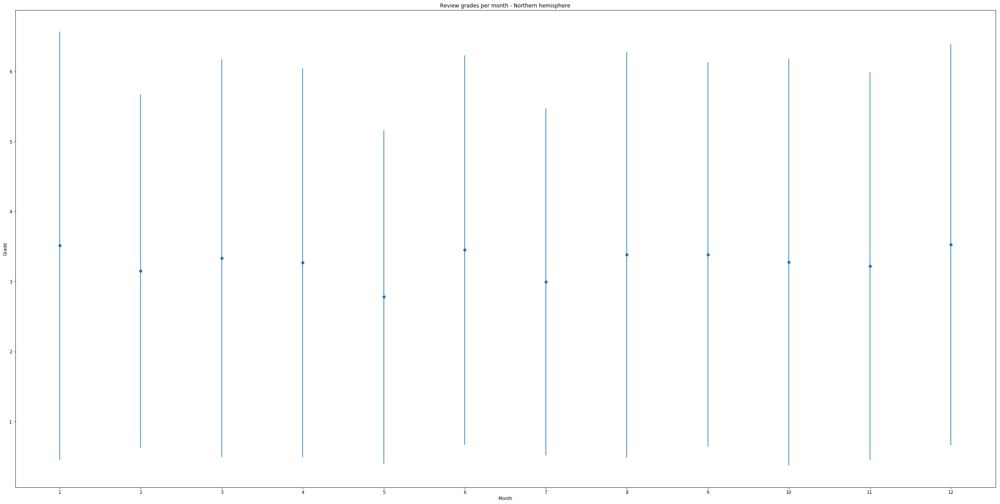

In [128]:
keys = [int(key) for key in list(dategrade.keys())]
plt.errorbar(keys, avggrade, sdgrade, linestyle='None', marker='o')
plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review grades per month')
plt.xlabel('Month')
plt.ylabel('Grade')
plt.show()

keys = [int(key) for key in list(dategrade_sh.keys())]
plt.errorbar(keys, avggrade_sh, sdgrade_sh, linestyle='None', marker='o')
plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review grades per month - Southern hemisphere')
plt.xlabel('Month')
plt.ylabel('Grade')
plt.show()

keys = [int(key) for key in list(dategrade_nh.keys())]
plt.errorbar(keys, avggrade_nh, sdgrade_nh, linestyle='None', marker='o')
plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review grades per month - Northern hemisphere')
plt.xlabel('Month')
plt.ylabel('Grade')
plt.show()

In [87]:
weekgrade = {}
avgwgrade = []
sdwgrade = []

# declare an empty array for each month
for i in set(NNweeklist):
    week = str(i)
    weekgrade[week] = []

# create array of grades for reviews written in each month
for i in range(len(NNweeklist)):
    week = str(NNweeklist[i])
    weekgrade[week].append(NNgradelist[i])

# calculate average and standard deviation for each grade array
for key, values in weekgrade.items():
    avgwgrade.append(np.mean(values))
    sdwgrade.append(np.std(values))

In [99]:
christmasweek = [52, 1]
easterweek = [13, 14]

averagegrade = np.mean(avgwgrade)
christmasgrade = (avgwgrade[christmasweek[0]] + avgwgrade[christmasweek[1]])/2
eastergrade = (avgwgrade[easterweek[0]] + avgwgrade[easterweek[1]])/2

print('The average grade over the year is %s' % averagegrade)
print('The average grade in the christmas holiday is %s' % christmasgrade)
print('The average grade in the easter break is %s' % eastergrade)


The average grade over the year is 3.47461312921244
The average grade in the christmas holiday is 3.487475280158207
The average grade in the easter break is 3.3741109530583215


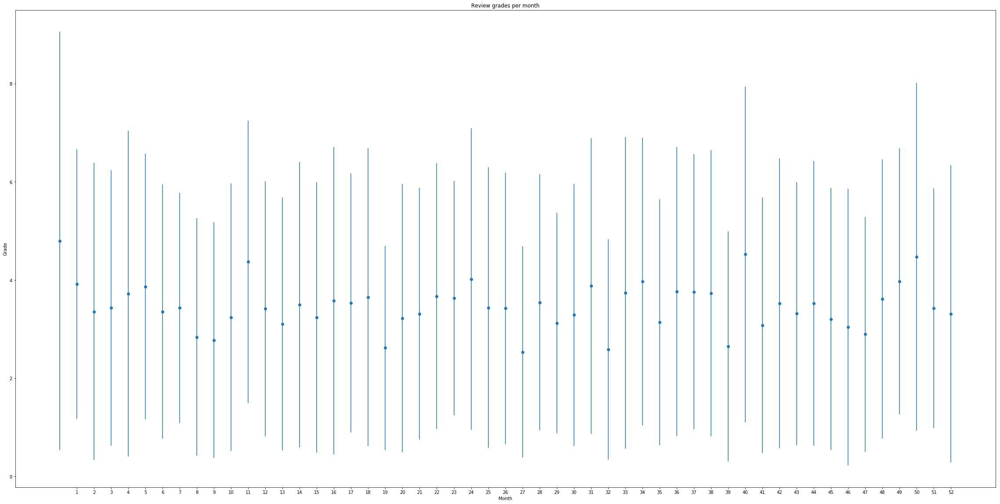

In [92]:
keys = [int(key) for key in list(weekgrade.keys())]
plt.errorbar(keys, avgwgrade, sdwgrade, linestyle='None', marker='o')
plt.xticks(np.linspace(1,52,52,dtype='int16'))
plt.title('Review grades per month')
plt.xlabel('Month')
plt.ylabel('Grade')
plt.rcParams["figure.figsize"] = [40,20]
plt.show()

In [129]:
datesent = {}
avgsent = []
sdsent = []
datesent_nh = {}
avgsent_nh = []
sdsent_nh = []
datesent_sh = {}
avgsent_sh = []
sdsent_sh = []

# declare an empty array for each month
for i in set(NNdatelist):
    month = str(i)
    datesent[month] = []
    datesent_nh[month] = []
    datesent_sh[month] = []
    

# create array of grades for reviews written in each month
for i in range(len(NNdatelist)):
    month = str(NNdatelist[i])
    hemisphere = NNhemispherelist[i]
    datesent[month].append(NNsentlist[i])
    if hemisphere == 'sh':
        datesent_sh[month].append(NNsentlist[i])
    elif hemisphere == 'nh':
        datesent_nh[month].append(NNsentlist[i])
    

# calculate average and standard deviation for each grade array
for key, values in datesent.items():
    avgsent.append(np.mean(values))
    sdsent.append(np.std(values))
    
for key, values in datesent_sh.items():
    avgsent_sh.append(np.mean(values))
    sdsent_sh.append(np.std(values))

for key, values in datesent_nh.items():
    avgsent_nh.append(np.mean(values))
    sdsent_nh.append(np.std(values))

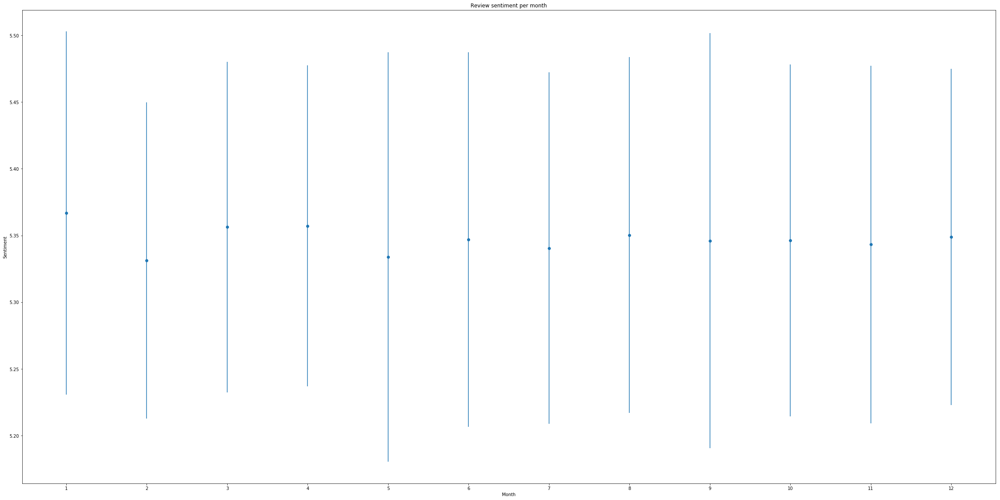

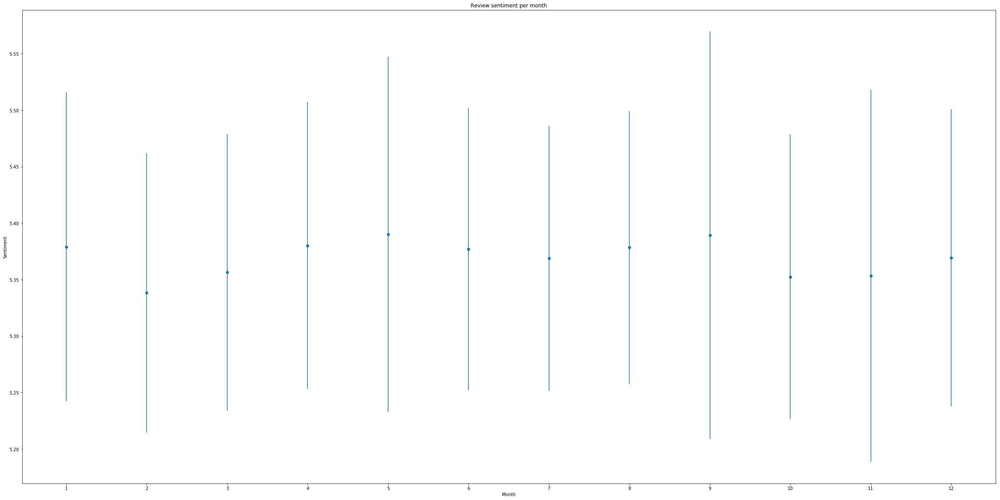

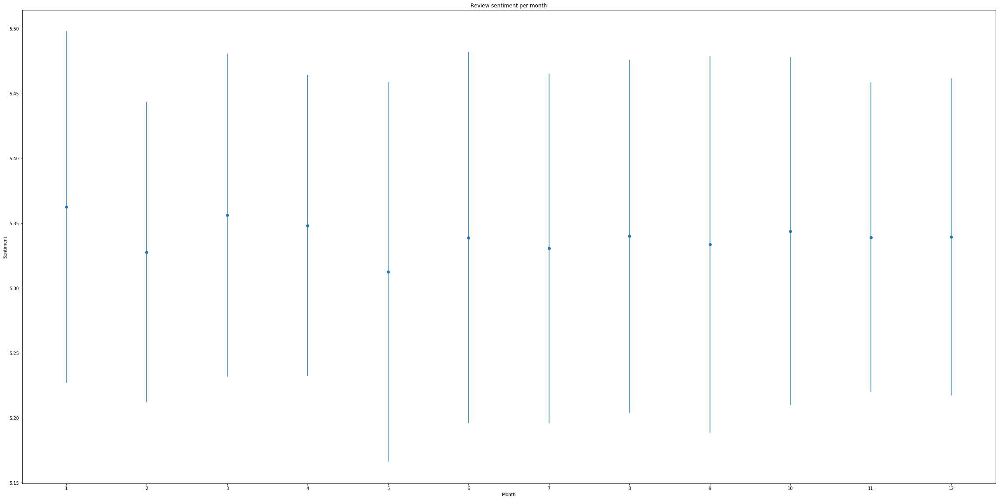

In [131]:
keys = [int(key) for key in list(datesent.keys())]
plt.errorbar(keys, avgsent, sdsent, linestyle='None', marker='o')
plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review sentiment per month')
plt.xlabel('Month')
plt.ylabel('Sentiment')
plt.show()

keys = [int(key) for key in list(datesent_sh.keys())]
plt.errorbar(keys, avgsent_sh, sdsent_sh, linestyle='None', marker='o')
plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review sentiment per month')
plt.xlabel('Month')
plt.ylabel('Sentiment')
plt.show()

keys = [int(key) for key in list(datesent_nh.keys())]
plt.errorbar(keys, avgsent_nh, sdsent_nh, linestyle='None', marker='o')
plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review sentiment per month')
plt.xlabel('Month')
plt.ylabel('Sentiment')
plt.show()

In [95]:
weeksent = {}
avgwsent = []
sdwsent = []

# declare an empty array for each month
for i in set(NNweeklist):
    week = str(i)
    weeksent[week] = []

# create array of sentiment values for reviews written in each month
for i in range(len(NNweeklist)):
    week = str(NNweeklist[i])
    weeksent[week].append(NNsentlist[i])

# calculate average and standard deviation for each sentiment array
for key, values in weeksent.items():
    avgwsent.append(np.mean(values))
    sdwsent.append(np.std(values))

In [100]:
averagesent = np.mean(avgwsent)
christmassent = (avgwsent[christmasweek[0]] + avgwsent[christmasweek[1]])/2
eastersent = (avgwsent[easterweek[0]] + avgwsent[easterweek[1]])/2

print('The average grade over the year is %s' % averagesent)
print('The average grade in the christmas holiday is %s' % christmassent)
print('The average grade in the easter break is %s' % eastersent)


The average grade over the year is 5.350922438600294
The average grade in the christmas holiday is 5.364322023518449
The average grade in the easter break is 5.34658989200126


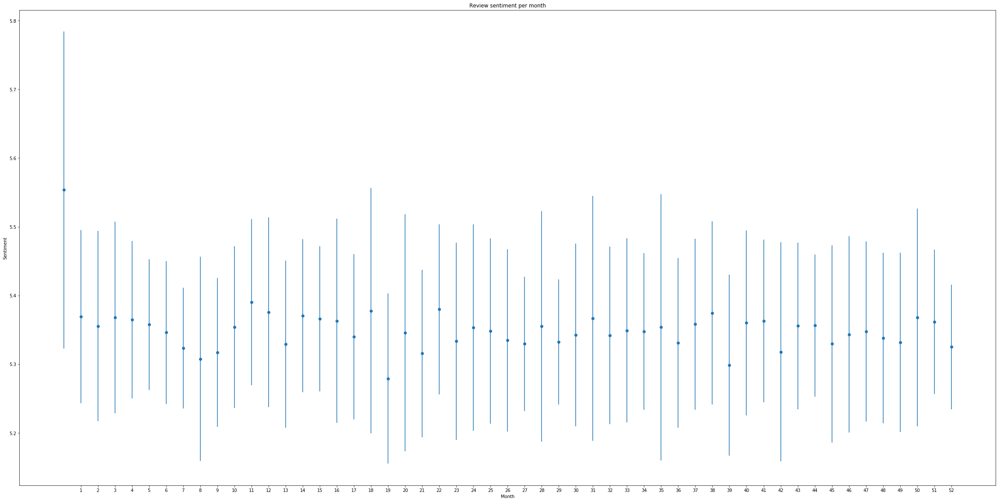

In [98]:
keys = [int(key) for key in list(weeksent.keys())]
plt.errorbar(keys, avgwsent, sdwsent, linestyle='None', marker='o')
plt.xticks(np.linspace(1,52,52,dtype='int16'))
plt.title('Review sentiment per month')
plt.xlabel('Month')
plt.ylabel('Sentiment')
plt.show()

### Review and Sentiment based on Degree

In [139]:
degreegrade = {}
avgdgrade = []
sddgrade = []


# declare an empty array for each month
for i in set(NNdegreelist):
    degree = str(i)
    degreegrade[degree] = []

# create array of grades for reviews written in each month
for i in range(len(NNdegreelist)):
    degree = str(NNdegreelist[i])
    degreegrade[degree].append(NNgradelist[i])
    

# calculate average and standard deviation for each grade array
for key, values in degreegrade.items():
    avgdgrade.append(np.mean(values))
    sddgrade.append(np.std(values))
    

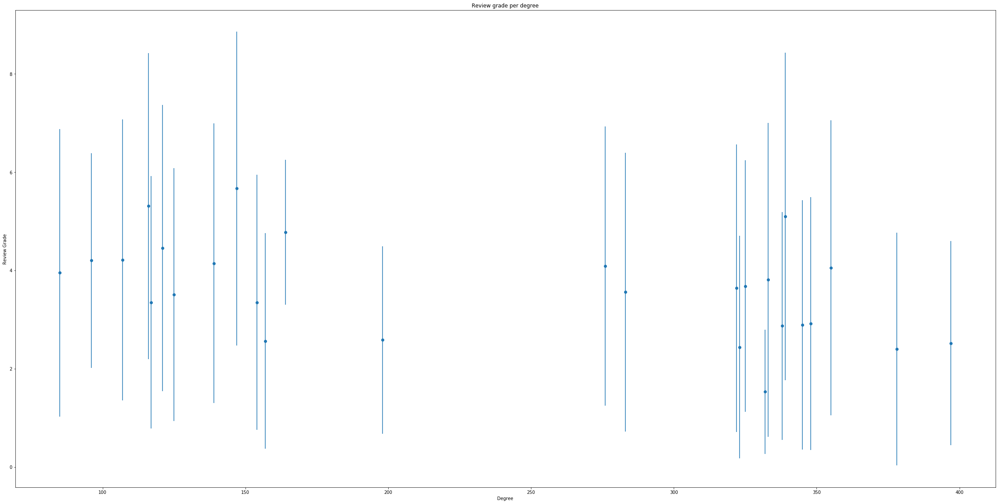

In [140]:
keys = [int(key) for key in list(degreegrade.keys())]
plt.errorbar(keys, avgdgrade, sddgrade, linestyle='None', marker='o')
#plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Review grade per degree')
plt.xlabel('Degree')
plt.ylabel('Review Grade')
plt.show()

In [141]:
degreegrade = {}
avgdgrade = []
sddgrade = []


# declare an empty array for each month
for i in set(NNdegreelist):
    degree = str(i)
    degreegrade[degree] = []

# create array of grades for reviews written in each month
for i in range(len(NNdegreelist)):
    degree = str(NNdegreelist[i])
    degreegrade[degree].append(NNgradelist[i])
    

# calculate average and standard deviation for each grade array
for key, values in degreegrade.items():
    avgdgrade.append(np.mean(values))
    sddgrade.append(np.std(values))
    

In [144]:
degreesent = {}
avgssent = []
sdssent = []


# declare an empty array for each month
for i in set(NNdegreelist):
    degree = str(i)
    degreesent[degree] = []

# create array of grades for reviews written in each month
for i in range(len(NNdegreelist)):
    degree = str(NNdegreelist[i])
    degreesent[degree].append(NNsentlist[i])
    

# calculate average and standard deviation for each grade array
for key, values in degreesent.items():
    avgssent.append(np.mean(values))
    sdssent.append(np.std(values))
    

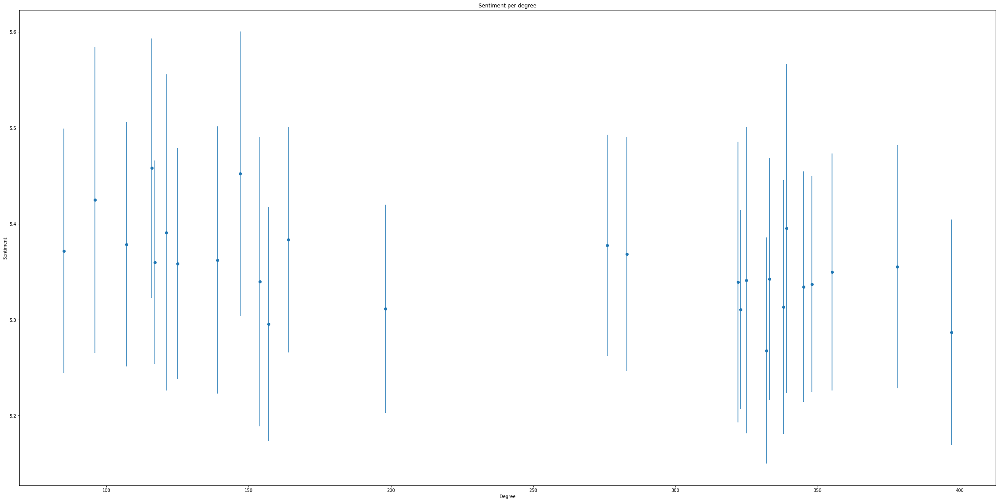

In [146]:
keys = [int(key) for key in list(degreesent.keys())]
plt.errorbar(keys, avgssent, sdssent, linestyle='None', marker='o')
#plt.xticks(np.linspace(1,12,12,dtype='int16'))
plt.title('Sentiment per degree')
plt.xlabel('Degree')
plt.ylabel('Sentiment')
plt.show()

### Number of reviews per person

In [ ]:
print('Number of reviews:', len(authlist))
print('Number of unique authors:', len(set(authlist)))

In [ ]:
authdict = {}

# List author of all reviews
for airport, d in reviewdict.items():
    for review in d['reviews']:
        author = review['author']
        authdict[author] = authlist.count(author)
        
print(sorted(((c, a) for a, c in authdict.items()), reverse=True)[0:50], "\n")

In [ ]:
counts = list(authdict.values())
x = list(set(counts))
y = [counts.count(i) for i in x]

plt.plot(x, y, lw=0, marker='o')
plt.title('Amount of reviews per person')
plt.xlabel('Number of reviews')
plt.ylabel('Number of authors')
plt.show()

In [ ]:
plt.plot(x, y, lw=0, marker='o')
plt.title('Amount of reviews per person')
plt.xlabel('Number of reviews')
plt.ylabel('Number of authors')
plt.ylim(0,140)
plt.show()

### TF-IDF and wordclouds

In [ ]:
# function to calculate TF-IDF
def tfidf(word, doc, docs):
    tf = doc.count(word)
    ndocs_having_word = sum(1 for doc in docs if word in doc)
    idf = math.log(len(docs) / ndocs_having_word)
    return tf*idf

In [ ]:
# combine all reviews into one big text
reviewtext = [reviewdict['frankfurt main airport']['reviews'][i]['text'] 
              for i in range(len(reviewdict['frankfurt main airport']['reviews']))]
reviewtext = " ".join(reviewtext)

# visualize text as wordcloud
wordcloud = WordCloud(background_color='white', width=800, height=400, collocations=False).generate(reviewtext)
plt.figure(dpi=100)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Frankfurt Main")
plt.show()

In [ ]:
stopwords = stopwords.words('english')

doclist = []
for i in range(len(airports)):
    airports[i] = airports[i].replace("-", " ")
    reviewtext = [reviewdict[airports[i]]['reviews'][j]['text'] 
                  for j in range(len(reviewdict[airports[i]]['reviews']))]
    reviewtext = " ".join(reviewtext)
    tokens = word_tokenize(reviewtext)
    names = airports[i].split()
    
    # filter out stopwords and airport name and city
    filt = stopwords + names + airport_codes
    tokens = [token.lower() for token in tokens if token.lower() not in filt
              and token not in string.punctuation]
    doclist.append(tokens)

In [ ]:
# create one long list for each continent
docs_EU = [tokens for tokens in doclist[0:5]]
docs_EU = [y for x in docs_EU for y in x]

docs_NA = [tokens for tokens in doclist[5:10]]
docs_NA = [y for x in docs_NA for y in x]

docs_SA = [tokens for tokens in doclist[10:15]]
docs_SA = [y for x in docs_SA for y in x]

docs_AF = [tokens for tokens in doclist[15:20]]
docs_AF = [y for x in docs_AF for y in x]

docs_AS = [tokens for tokens in doclist[20:25]]
docs_AS = [y for x in docs_AS for y in x]

docs_OC = [tokens for tokens in doclist[25:30]]
docs_OC = [y for x in docs_OC for y in x]

doclist = [docs_EU,docs_NA,docs_SA,docs_AF,docs_AS,docs_OC]

In [ ]:
# calculate TF-IDF and visualize wordcloud based on highest scoring words
for i in range(len(doclist)):
    tf_idf = dict([(word, tfidf(word, doclist[i], doclist)) for word in set(doclist[i])])

    text = []
    for word, val in tf_idf.items():
        text.extend([word]*round(val))
    text = " ".join(text)      # Joining in a string is necessary for WordCloud
    
    wordcloud = WordCloud(background_color='white', width=800, height=400, collocations=False).generate(text)
    plt.figure(dpi=100)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(continents[i])
    plt.show()

### Positive and negative reviews

In [ ]:
# create list with sentiments of all reviews
all_sent = []
for airport, d in reviewdict.items():
    reviewlist = d['reviews']
    for i in range(len(reviewlist)):
        text = reviewlist[i]['text']
        s = sentiment(text)
        if s > 0:
            all_sent.append(s)

In [ ]:
# calculate mean and SD of sentiments of all reviews
m = np.mean(all_sent)
print("Mean sentiment: ", m)
SD = np.std(all_sent)
print("SD sentiment: ", SD)

In [ ]:
# list all reviews for each airport with a sentiment lower than (mean - 2*SD)
print('NEGATIVE REVIEW COUNT\n')
neg_doclist = []
for airport, d in reviewdict.items():
    reviewlist = d['reviews']
    neg_reviews = []
    count = 0
    for i in range(len(reviewlist)):
        text = reviewlist[i]['text']
        if sentiment(text)<(m-2*SD):
            neg_reviews.append(text)
            count += 1
    
    print(airport, ": {}".format(count))
    if neg_reviews == []:
        neg_doclist.append(["empty"])
    else:
        neg_reviews = " ".join(neg_reviews)    
        tokens = word_tokenize(neg_reviews)
        names = airport.split()
        filt = stopwords + names + airport_codes
        tokens = [token.lower() for token in tokens if token.lower() not in filt
                  and token not in string.punctuation]
        neg_doclist.append(tokens)

In [ ]:
# create one long list for each continent
neg_docs_EU = [tokens for tokens in neg_doclist[0:5]]
neg_docs_EU = [y for x in neg_docs_EU for y in x]

neg_docs_NA = [tokens for tokens in neg_doclist[5:10]]
neg_docs_NA = [y for x in neg_docs_NA for y in x]

neg_docs_SA = [tokens for tokens in neg_doclist[10:15]]
neg_docs_SA = [y for x in neg_docs_SA for y in x]

neg_docs_AF = [tokens for tokens in neg_doclist[15:20]]
neg_docs_AF = [y for x in neg_docs_AF for y in x]

neg_docs_AS = [tokens for tokens in neg_doclist[20:25]]
neg_docs_AS = [y for x in neg_docs_AS for y in x]

neg_docs_OC = [tokens for tokens in neg_doclist[25:30]]
neg_docs_OC = [y for x in neg_docs_OC for y in x]

neg_doclist = [neg_docs_EU,neg_docs_NA,neg_docs_SA,neg_docs_AF,neg_docs_AS,neg_docs_OC]

In [67]:
# visualize these negative reviews according to their TF-IDF score
for i in range(len(neg_doclist)):
    tf_idf = dict([(word, tfidf(word, neg_doclist[i], neg_doclist)) for word in set(neg_doclist[i])])

    text = []
    for word, val in tf_idf.items():
        text.extend([word]*round(val))
    text = " ".join(text)      # Joining in a string is necessary for WordCloud
    
    wordcloud = WordCloud(background_color='white', width=800, height=400, collocations=False).generate(text)
    plt.figure(dpi=100)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(continents[i])
    plt.show()

NameError: name 'neg_doclist' is not defined

In [68]:
# list all reviews for each airport with a sentiment higher than (mean + 2*SD)
print("POSITIVE REVIEW COUNT\n")
pos_doclist = []
for airport, d in reviewdict.items():
    reviewlist = d['reviews']
    pos_reviews = []
    count = 0
    for i in range(len(reviewlist)):
        text = reviewlist[i]['text']
        if sentiment(text)>(m+2*SD):
            pos_reviews.append(text)
            count += 1
    
    print(airport, ": {}".format(count))
    if pos_reviews == []:
        pos_doclist.append(["empty"])
    else:
        pos_reviews = " ".join(pos_reviews)    
        tokens = word_tokenize(pos_reviews)
        names = airport.split()
        filt = stopwords + names + airport_codes
        tokens = [token.lower() for token in tokens if token.lower() not in filt
                  and token not in string.punctuation]
        pos_doclist.append(tokens)


POSITIVE REVIEW COUNT



NameError: name 'SD' is not defined

In [69]:
# create one long list for each continent
pos_docs_EU = [tokens for tokens in pos_doclist[0:5]]
pos_docs_EU = [y for x in pos_docs_EU for y in x]

pos_docs_NA = [tokens for tokens in pos_doclist[5:10]]
pos_docs_NA = [y for x in pos_docs_NA for y in x]

pos_docs_SA = [tokens for tokens in pos_doclist[10:15]]
pos_docs_SA = [y for x in pos_docs_SA for y in x]

pos_docs_AF = [tokens for tokens in pos_doclist[15:20]]
pos_docs_AF = [y for x in pos_docs_AF for y in x]

pos_docs_AS = [tokens for tokens in pos_doclist[20:25]]
pos_docs_AS = [y for x in pos_docs_AS for y in x]

pos_docs_OC = [tokens for tokens in pos_doclist[25:30]]
pos_docs_OC = [y for x in pos_docs_OC for y in x]

pos_doclist = [pos_docs_EU,pos_docs_NA,pos_docs_SA,pos_docs_AF,pos_docs_AS,pos_docs_OC]

In [70]:
# visualize these positive reviews according to their TF-IDF score
for i in range(len(pos_doclist)):
    tf_idf = dict([(word, tfidf(word, pos_doclist[i], pos_doclist)) for word in set(pos_doclist[i])])

    text = []
    for word, val in tf_idf.items():
        text.extend([word]*round(val))
    text = " ".join(text)      # Joining in a string is necessary for WordCloud
    
    wordcloud = WordCloud(background_color='white', width=800, height=400, collocations=False).generate(text)
    plt.figure(dpi=100)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(continents[i])
    plt.show()

ValueError: We need at least 1 word to plot a word cloud, got 0.